In [1]:
import torch
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import pickle

In [2]:
print(torch.cuda.is_available())

True


In [3]:
# Проверяем, доступны ли GPU
device = 'cuda' if torch.cuda.is_available() else 'cpu'

In [4]:
# Загрузка DataFrame из файла
with open(r'./datasets/dataset.pkl', 'rb') as f:
    df = pickle.load(f)

In [5]:
crystal = df['Crystal']
Crystal = []

for i in crystal:
    i = i[1:]
    foo, fooo = i.split(".")
    i = foo
    #print(i)
    Crystal.append(i)

In [6]:
df['Crystal'] = Crystal
print(df['Crystal'].unique())
print(df['Stats'].unique())

['Ag' 'Al' 'Al2O3_sapphire' 'Au' 'B4C' 'Ba' 'Be' 'BeO' 'C_diamond'
 'C_graphite' 'Cr' 'Cs' 'Cu' 'Cu2MnAl' 'Fe' 'Ga' 'Gd' 'Ge' 'H2O_ice_1h'
 'He4_hcp' 'Hg' 'I2' 'K' 'Li' 'LiF' 'Mo' 'Na2Ca3Al2F14' 'Nb' 'Ni' 'Pb'
 'Pt' 'Rb' 'Si' 'Ti' 'Tl' 'UO2' 'Zn' 'Y2O3']
[1.e+07 2.e+07 5.e+07 1.e+08 2.e+08 5.e+08]


In [7]:
# Определяем целевые значения
target_crystals = ['Al', 'Al2O3_sapphire', 'Ba', 'Be', 'BeO', 'C_diamond',
                  'C_graphite', 'Cr', 'Cs', 'Cu', 'Cu2MnAl', 'Fe', 'Ga', 'Ge',
                  'He4_hcp', 'I2', 'K', 'Mo', 'Na2Ca3Al2F14', 'Nb', 'Ni', 'Pb', 'Pt',
                  'Rb', 'Si', 'Ti', 'Tl', 'UO2', 'Zn', 'Y2O3']

target_stats = [2.e+08, 5.e+08]

# Применяем фильтрацию к исходному датафрейму
df = df[
    df['Crystal'].isin(target_crystals) & 
    df['Stats'].isin(target_stats)
]
df = df.reset_index(drop= True)

In [ ]:
['Al2O3_sapphire', 'C_graphite', 'Na2Ca3Al2F14', 'Rb', 'Si', 'UO2']

In [8]:
# Загрузка DataFrame из файла
with open(r'./datasets/segmentation_maps.pkl', 'rb') as f:
    df_seg_maps = pickle.load(f)

In [9]:
import torch
from torch.utils.data import Dataset, DataLoader
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings('ignore')

class DiffractionDataset(Dataset):
    def __init__(self, df, df_seg_matrices, transform=None, crystal_list=None):
        """
        Args:
            df: DataFrame с экспериментальными данными
            df_seg_matrices: DataFrame с масками сегментации
            transform: преобразования для изображений и масок
            crystal_list: список кристаллических структур для этого датасета
        """
        self.df = df.reset_index(drop=True)
        self.df_seg_matrices = df_seg_matrices
        self.transform = transform
        
        # Если указан список кристаллов, фильтруем данные
        if crystal_list is not None:
            self.df = self.df[self.df['Crystal'].isin(crystal_list)].copy().reset_index(drop=True)
        
        # Создаем словарь для быстрого доступа к маскам
        self.mask_dict = {}
        mask_df = df_seg_matrices.set_index('Crystal')
        for crystal in mask_df.index.unique():
            mask = mask_df.loc[crystal, 'Mask']
            if isinstance(mask, pd.Series):
                mask = mask.iloc[0]  # Берем первую маску если их несколько
            self.mask_dict[crystal] = mask
            
    def __len__(self):
        return len(self.df)
    
    def __getitem__(self, idx):
        # Получаем данные из df
        row = self.df.iloc[idx]
        crystal = row['Crystal']
        
        # Загружаем дифракционное изображение
        image = row['Matrix']
        
        # Получаем соответствующую маску
        mask = self.mask_dict[crystal]
        
        # Преобразуем в тензоры
        if not isinstance(image, torch.Tensor):
            image = torch.from_numpy(np.array(image)).float()
        if not isinstance(mask, torch.Tensor):
            mask = torch.from_numpy(np.array(mask)).long()
            
        # Добавляем channel dimension для изображения
        if len(image.shape) == 2:
            image = image.unsqueeze(0)  # [1, H, W]
            
        # Применяем преобразования если есть
        if self.transform:
            image, mask = self.transform(image, mask)
            
        return image, mask

# Функции для разных стратегий разделения

def split_by_crystal_stratified(df, test_size=0.2, random_state=42):
    """
    Стратегия 1: Разделяет данные так, чтобы кристаллические структуры в тесте 
    не пересекались с трейном (полное разделение по кристаллам)
    """
    # Получаем уникальные кристаллические структуры
    unique_crystals = df['Crystal'].unique()
    
    # Разделяем кристаллы на train и test
    train_crystals, test_crystals = train_test_split(
        unique_crystals, 
        test_size=test_size, 
        random_state=random_state,
        shuffle=True
    )
    
    # Создаем train и test датафреймы
    train_df = df[df['Crystal'].isin(train_crystals)].copy()
    test_df = df[df['Crystal'].isin(test_crystals)].copy()
    
    print(f"Стратегия: Разделение по кристаллам (без пересечений)")
    print(f"Train crystals ({len(train_crystals)}): {train_crystals}")
    print(f"Test crystals ({len(test_crystals)}): {test_crystals}")
    print(f"Train samples: {len(train_df)}")
    print(f"Test samples: {len(test_df)}")
    
    return train_df, test_df, train_crystals, test_crystals

def split_simple_stratified(df, test_size=0.2, random_state=42, stratify_by_crystal=True):
    """
    Стратегия 2: Простое разделение, где каждый кристалл может быть и в трейне и в тесте
    
    Args:
        stratify_by_crystal: если True, стратифицируем по кристаллам
    """
    if stratify_by_crystal:
        # Стратифицируем по кристаллам для сбалансированного разделения
        train_df, test_df = train_test_split(
            df,
            test_size=test_size,
            random_state=random_state,
            stratify=df['Crystal'],  # Стратификация по кристаллам
            shuffle=True
        )
    else:
        # Простое случайное разделение
        train_df, test_df = train_test_split(
            df,
            test_size=test_size,
            random_state=random_state,
            shuffle=True
        )
    
    # Получаем уникальные кристаллы в каждой выборке
    train_crystals = train_df['Crystal'].unique()
    test_crystals = test_df['Crystal'].unique()
    
    # Находим пересечение кристаллов
    intersection = set(train_crystals) & set(test_crystals)
    
    print(f"Стратегия: Простое разделение (с пересечениями)")
    print(f"Train crystals ({len(train_crystals)}): {len(train_crystals)} уникальных")
    print(f"Test crystals ({len(test_crystals)}): {len(test_crystals)} уникальных")
    print(f"Пересечение кристаллов: {len(intersection)} общих кристаллов")
    print(f"Train samples: {len(train_df)}")
    print(f"Test samples: {len(test_df)}")
    
    # Для совместимости возвращаем train_crystals и test_crystals
    return train_df, test_df, train_crystals, test_crystals

def split_data(df, strategy='crystal', test_size=0.2, random_state=42, **kwargs):
    """
    Основная функция разделения данных с выбором стратегии
    
    Args:
        df: DataFrame с данными
        strategy: стратегия разделения
            - 'crystal': разделение по кристаллам (без пересечений)
            - 'simple': простое разделение (с пересечениями)
        test_size: доля тестовой выборки
        random_state: seed для воспроизводимости
        **kwargs: дополнительные аргументы для стратегий
    
    Returns:
        train_df, test_df, train_crystals, test_crystals
    """
    if strategy == 'crystal':
        return split_by_crystal_stratified(df, test_size, random_state)
    elif strategy == 'simple':
        stratify_by_crystal = kwargs.get('stratify_by_crystal', True)
        return split_simple_stratified(df, test_size, random_state, stratify_by_crystal)
    else:
        raise ValueError(f"Неизвестная стратегия: {strategy}. Используйте 'crystal' или 'simple'")

In [10]:
def create_dataloaders(df, df_seg_matrices, batch_size=32, test_size=0.2, 
                       shuffle=True, num_workers=0, random_state=42,
                       split_strategy='crystal', **split_kwargs):
    """
    Создает DataLoader'ы с выбором стратегии разделения
    
    Args:
        split_strategy: стратегия разделения
            - 'crystal': разделение по кристаллам (без пересечений)
            - 'simple': простое разделение (с пересечениями)
        split_kwargs: дополнительные аргументы для стратегии разделения
    """
    print(f"\n{'='*60}")
    print(f"Создание DataLoader'ов со стратегией: {split_strategy}")
    print(f"{'='*60}")
    
    # Разделяем данные согласно выбранной стратегии
    train_df, test_df, train_crystals, test_crystals = split_data(
        df, 
        strategy=split_strategy,
        test_size=test_size, 
        random_state=random_state,
        **split_kwargs
    )
    
    # Создаем датасеты
    train_dataset = DiffractionDataset(
        train_df, 
        df_seg_matrices, 
        transform=None,
        crystal_list=None  # Не фильтруем по crystal_list для простого разделения
    )
    
    test_dataset = DiffractionDataset(
        test_df, 
        df_seg_matrices, 
        transform=None,
        crystal_list=None
    )
    
    # Определяем параметры для DataLoader
    loader_kwargs = {
        'batch_size': batch_size,
        'shuffle': shuffle,
        'pin_memory': True if torch.cuda.is_available() else False
    }
    
    # Добавляем num_workers только если он > 0
    if num_workers > 0:
        loader_kwargs['num_workers'] = num_workers
        loader_kwargs['persistent_workers'] = True if num_workers > 0 else False
    
    # Создаем DataLoader'ы
    train_loader = DataLoader(train_dataset, **loader_kwargs)
    
    # Для test_loader отключаем shuffle
    loader_kwargs['shuffle'] = False
    test_loader = DataLoader(test_dataset, **loader_kwargs)
    
    return train_loader, test_loader, train_crystals, test_crystals

In [11]:
# Создаем DataLoader'ы
train_loader, test_loader, train_crystals, test_crystals = create_dataloaders(
    df=df,
    df_seg_matrices=df_seg_maps,
    batch_size=3,
    test_size=0.2,
    shuffle=True,
    random_state=42,
    split_strategy='simple' # 'crystal' 'simple'
)

# Проверяем размерность батча
for diffractions, masks in train_loader:
    print(f"Images shape: {diffractions.shape}")  # [batch_size, 1, H, W]
    print(f"Masks shape: {masks.shape}")    # [batch_size, H, W]

    break


Создание DataLoader'ов со стратегией: simple
Стратегия: Простое разделение (с пересечениями)
Train crystals (30): 30 уникальных
Test crystals (30): 30 уникальных
Пересечение кристаллов: 30 общих кристаллов
Train samples: 960
Test samples: 240
Images shape: torch.Size([3, 1, 250, 480])
Masks shape: torch.Size([3, 250, 480])


In [14]:
tesr_samples = ['Al2O3_sapphire', 'C_graphite', 'Na2Ca3Al2F14', 'Rb', 'Si', 'UO2']

maxStats = 5.e+08
maxI = max(df['Pulce duration'].unique())

df_test = df[
    df['Crystal'].isin(tesr_samples) & 
    df['Stats'].isin([5.e+08]) & 
    df['Pulce duration'].isin([maxI])
]
df_test = df_test.reset_index(drop= True)

# Преобразование матриц в numpy массив перед преобразованием в тензоры
df_test_matrices = np.array(df_test['Matrix'].tolist())

# Преобразование данных в тензоры PyTorch
df_test_tensor = torch.FloatTensor(df_test_matrices)
df_test_tensor = df_test_tensor.unsqueeze(1)
df_test_tensor = df_test_tensor.to(device)
print(df_test_tensor.size())

df_test_GT = df_seg_maps[
    df_seg_maps['Crystal'].isin(tesr_samples)
]
df_test_GT = df_test_GT.reset_index(drop= True)

# Преобразование матриц в numpy массив перед преобразованием в тензоры
GT_test_matrices = np.array(df_test_GT['Mask'].tolist())

# Преобразование данных в тензоры PyTorch
GT_test_tensor = torch.FloatTensor(GT_test_matrices)
GT_test_tensor = GT_test_tensor.unsqueeze(1)
GT_test_tensor = GT_test_tensor.to(device)
print(GT_test_tensor.size())

torch.Size([6, 1, 250, 480])
torch.Size([6, 1, 250, 480])


In [21]:
import torch
import numpy as np

# Если у вас numpy массив
matrices = np.array(df_seg_maps['Mask'].to_list())  # shape: [N, H, W]
indices = [1, 6, 18, 23, 24, 27]
masks = torch.tensor(matrices[indices])  # shape: [6, H, W]

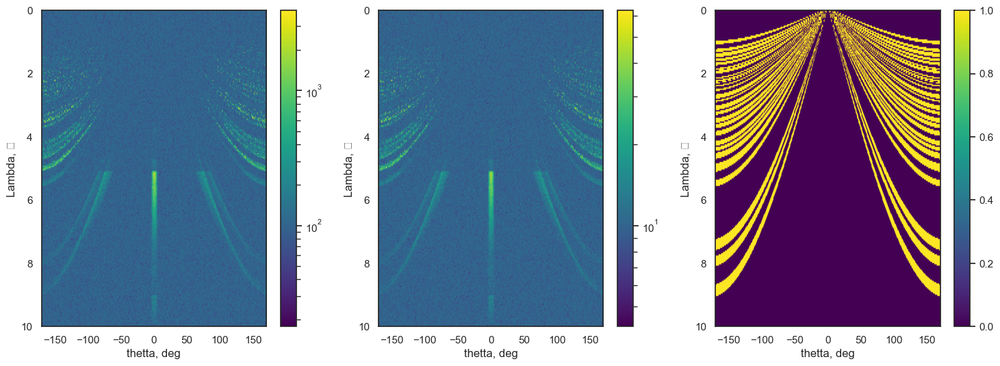

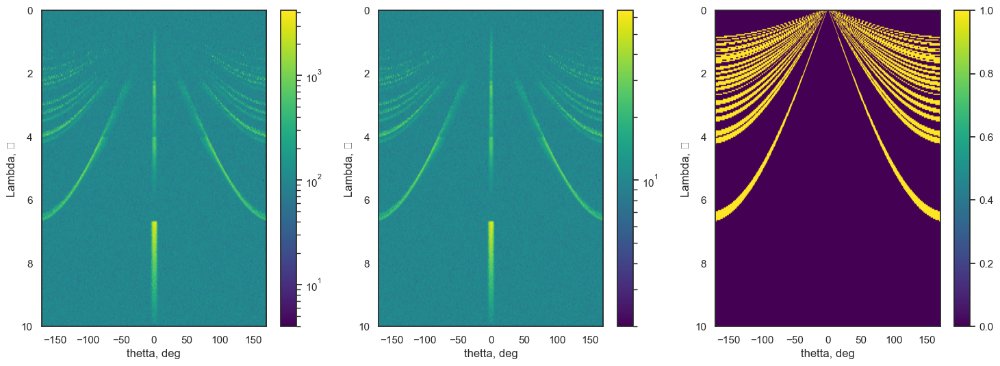

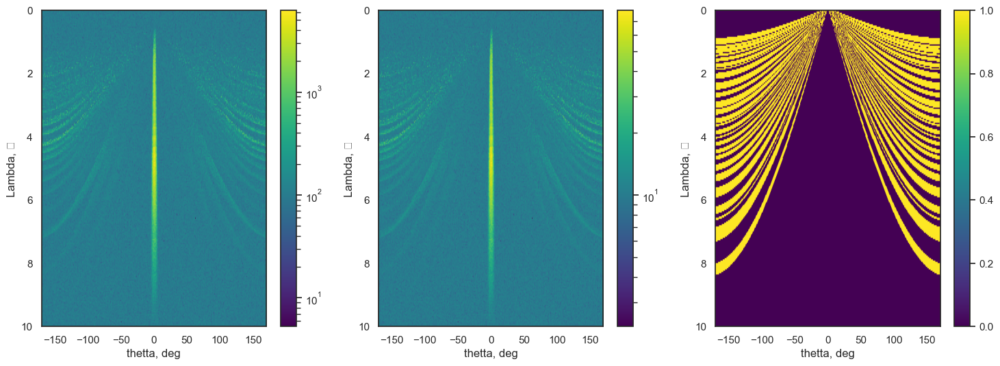

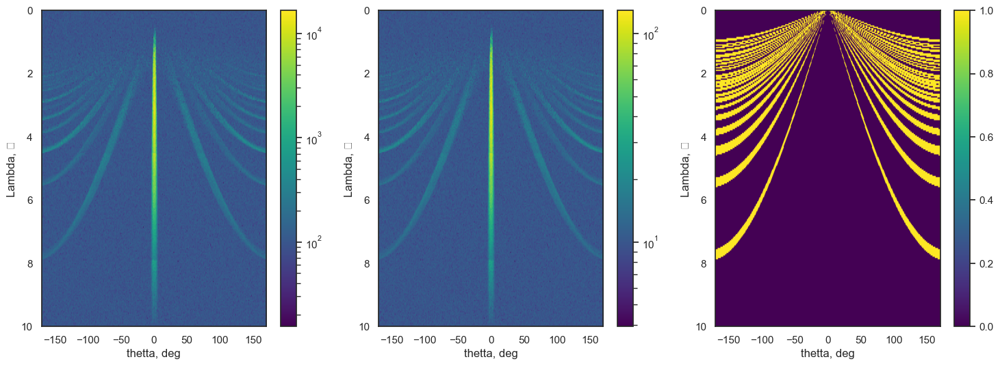

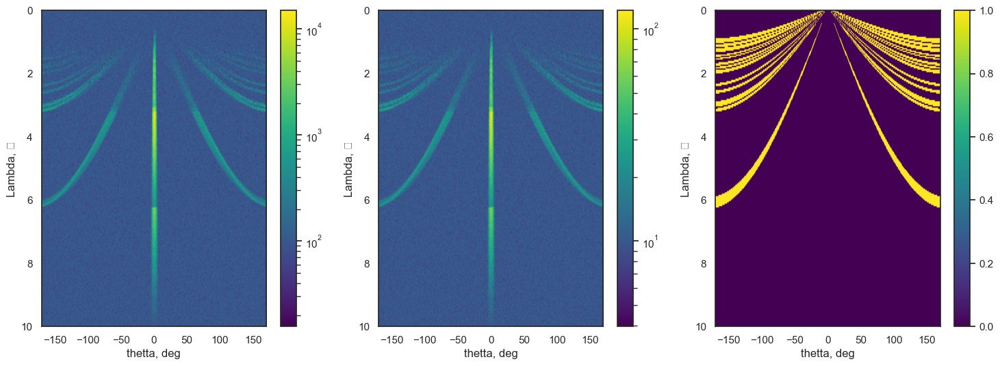

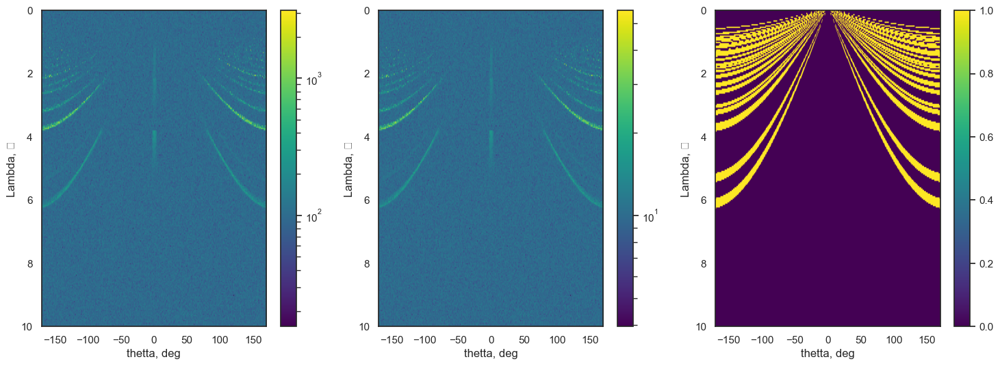

In [22]:
mu = 100
sigma = 0.2 * mu

# Создаем шум
noise = torch.randn_like(df_test_tensor, device=device) * sigma + mu
images = df_test_tensor + noise

# Матрица ошибок
error_matrix = torch.sqrt(torch.abs(images))
images = torch.cat([images, error_matrix], dim=1)  # [B, 2, H, W]


for data, mask in zip(images, masks):
    diffraction = data[0].cpu().numpy()
    error_matrix = data[1].cpu().numpy()

    # Создаем фигуру и оси
    fig, (ax1, ax2 ,ax3) = plt.subplots(1, 3, figsize=(18, 6))

    # Первый график
    im1 = ax1.imshow(diffraction, cmap='viridis', aspect='auto', norm='log', extent=(-170, 170, 10, 0))
    ax1.set_xlabel('thetta, deg')
    ax1.set_ylabel('Lambda, Å')
    plt.colorbar(im1)

    # Первый график
    im2 = ax2.imshow(error_matrix, cmap='viridis', aspect='auto', norm='log', extent=(-170, 170, 10, 0))
    ax2.set_xlabel('thetta, deg')
    ax2.set_ylabel('Lambda, Å')
    plt.colorbar(im2)

    # Первый график
    im3 = ax3.imshow(mask.numpy(), cmap='viridis', aspect='auto', extent=(-170, 170, 10, 0))
    ax3.set_xlabel('thetta, deg')
    ax3.set_ylabel('Lambda, Å')
    plt.colorbar(im3)

    plt.show()

In [23]:
import pickle

data_dict = {
    'crystal_structure': tesr_samples,
    'diffractions_error_matrix': images,
    'binary_masks': masks
}

with open('datasets/test_data.pkl', 'wb') as f:
    pickle.dump(data_dict, f)

# Загрузка
with open('datasets/test_data.pkl', 'rb') as f:
    loaded_dict = pickle.load(f)
    
crystal = loaded_dict['crystal_structure']
diffractions = loaded_dict['diffractions_error_matrix']
masks = loaded_dict['binary_masks']

In [18]:
torch.save(images, 'datasets/test_diffraction+error_matrices.pt')

In [12]:
from experiments.SwinUNet import SwinWNet

# Создаем модель
model = SwinWNet(
    patch_size=2, 
    in_chans=1, 
    error_matrix=True, 
    embed_dim=48, 
    depths=[2, 2, 2, 2], 
    num_heads=[3, 6, 12, 24],
    window_size=5, 
    mlp_ratio=4., 
    qkv_bias=True, 
    drop=0., 
    attn_drop=0., 
    drop_path=0.
).to(device)

In [13]:
def plot_grad_flow(named_parameters):
    ave_grads = []
    layers = []
    for n, p in named_parameters:
        if(p.requires_grad) and ("bias" not in n):
            layers.append(n)
            ave_grads.append(p.grad.abs().mean().cpu())
    plt.figure(figsize=(20, 6))
    plt.plot(ave_grads, alpha=0.3, color="b")
    plt.hlines(0, 0, len(ave_grads)+1, linewidth=1, color="k" )
    plt.xticks(range(0,len(ave_grads), 1), layers, rotation="vertical")
    plt.xlim(xmin=0, xmax=len(ave_grads))
    plt.yscale('log')
    plt.xlabel("Layers")
    plt.ylabel("average gradient")
    plt.title("Gradient flow")
    plt.grid(True)

In [19]:
import torch

optimizer = torch.optim.SGD(
    model.parameters(),   # специально передаём ВСЕ параметры
    lr=0.01,
    momentum=0.9,
    weight_decay=1e-3
)

scheduler = torch.optim.lr_scheduler.StepLR(
    optimizer,
    step_size=20,
    gamma=0.1
)

In [14]:
from Segmentator_pretrain import SegmentatorTrainer

seg_trainer = SegmentatorTrainer(
    model=model,
    train_loader=train_loader,
    val_loader=test_loader,
    device=device,
    loss='CombinedLoss',      # DiceLoss, TverskyLoss, FocalTverskyLoss, FocalBCE, CombinedLoss
    optimizer=None,      # if None → create default
    scheduler=None,      # if None → create default
    num_epochs=300,
    use_fp16=True
)

seg_trainer.train()

Epoch [1/300] Train Loss: 0.853942 Val Loss: 0.632878 LR: 4.00e-05


KeyboardInterrupt: 

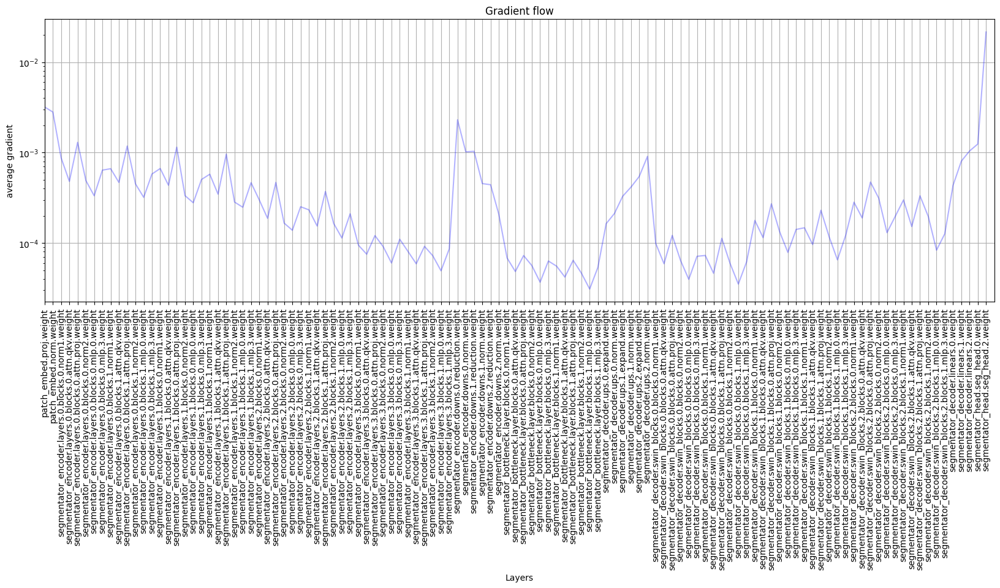

In [15]:
plot_grad_flow(model.named_parameters())

In [16]:
seg_trainer.release_training_state()

In [20]:
import torch

optimizer = torch.optim.SGD(
    model.parameters(),   # специально передаём ВСЕ параметры
    lr=0.01,
    momentum=0.9,
    weight_decay=1e-3
)

scheduler = torch.optim.lr_scheduler.StepLR(
    optimizer,
    step_size=20,
    gamma=0.1
)

In [22]:
from Upscaler_pretrain import UpscalerTrainer

ups_trainer = UpscalerTrainer(
    model=model,
    train_loader=train_loader,
    val_loader=test_loader,
    device=device,
    loss='SmoothL1Loss',      # MSELoss, L1Loss, SmoothL1Loss
    optimizer=None,      # if None → create default
    scheduler=None,      # if None → create default
    num_epochs=50,
    use_fp16=True
)

ups_trainer.train()

Epoch [1/50] Train Loss: 0.000763 Val Loss: 0.000510 LR: 4.00e-05


KeyboardInterrupt: 

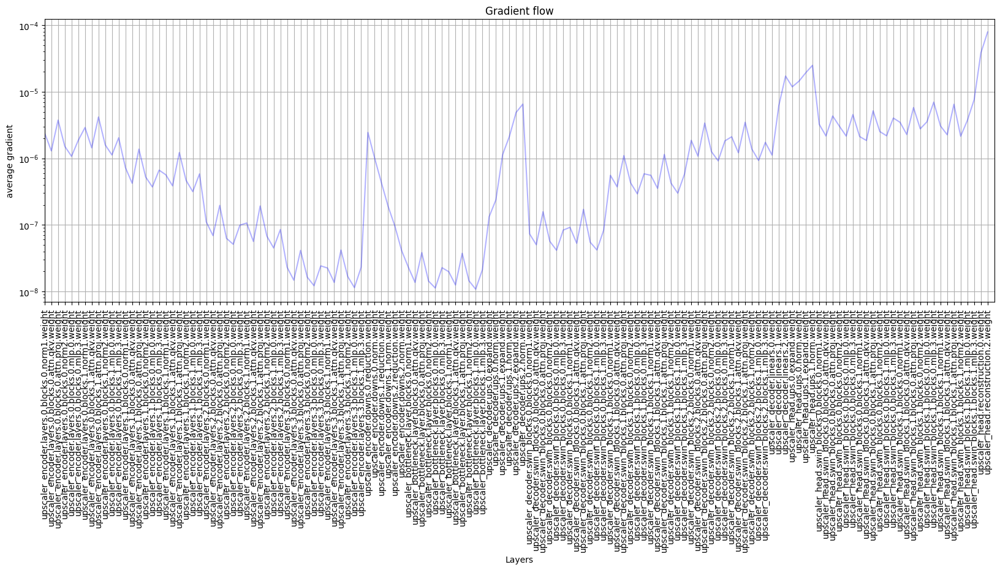

In [23]:
plot_grad_flow(model.named_parameters())

In [24]:
ups_trainer.release_training_state()

In [21]:
import torch

optimizer = torch.optim.SGD(
    model.parameters(),   # специально передаём ВСЕ параметры
    lr=0.01,
    momentum=0.9,
    weight_decay=1e-3
)

scheduler = torch.optim.lr_scheduler.StepLR(
    optimizer,
    step_size=20,
    gamma=0.1
)

In [26]:
from FullModel_supervised_trainer import FullModelTrainer

FullModel_trainer = FullModelTrainer(
    model=model,
    train_loader=train_loader,
    val_loader=test_loader,
    device=device,
    segmentator_loss='CombinedLoss',      # DiceLoss, TverskyLoss, FocalTverskyLoss, FocalBCE, CombinedLoss
    upscaler_loss='SmoothL1Loss',         # MSELoss, L1Loss, SmoothL1Loss
    optimizer=None,      # if None → create default
    scheduler=None,      # if None → create default
    num_epochs=100,
    seg_weight_lr=1.0,
    seg_weight_hr=1.0,
    rec_weight=1.0
)

FullModel_trainer.train()

KeyboardInterrupt: 

In [29]:
plot_grad_flow(model.named_parameters())

AttributeError: 'NoneType' object has no attribute 'abs'

In [25]:
FullModel_trainer.release_training_state()

In [14]:
from Supervised_train_full_pipline import SwinWNetTrainingPipeline

pipeline = SwinWNetTrainingPipeline(
    model=model,
    train_loader=train_loader,
    val_loader=test_loader,
    device=device,

    # эпохи
    seg_epochs=300,
    sr_epochs=50,
    full_epochs=100
)

pipeline.run()


========== STAGE 1: Segmentator Pretraining ==========



Epoch [1/300] Train Loss: 0.823137 Val Loss: 0.624162 LR: 4.00e-05


Epoch [2/300] Train Loss: 0.575994 Val Loss: 0.530938 LR: 6.00e-05


Epoch [3/300] Train Loss: 0.503487 Val Loss: 0.467840 LR: 8.00e-05


Epoch [4/300] Train Loss: 0.463878 Val Loss: 0.440278 LR: 1.00e-04


Epoch [5/300] Train Loss: 0.420862 Val Loss: 0.399821 LR: 1.20e-04


Epoch [6/300] Train Loss: 0.386643 Val Loss: 0.375048 LR: 1.40e-04


Epoch [7/300] Train Loss: 0.359759 Val Loss: 0.364336 LR: 1.60e-04


Epoch [8/300] Train Loss: 0.336191 Val Loss: 0.324585 LR: 1.80e-04


Epoch [9/300] Train Loss: 0.309579 Val Loss: 0.303242 LR: 2.00e-04


Epoch [10/300] Train Loss: 0.291452 Val Loss: 0.288400 LR: 2.00e-04


Epoch [11/300] Train Loss: 0.270821 Val Loss: 0.268398 LR: 2.00e-04


Epoch [12/300] Train Loss: 0.384079 Val Loss: 0.522921 LR: 2.00e-04


Epoch [13/300] Train Loss: 0.412535 Val Loss: 0.308353 LR: 2.00e-04


Epoch [14/300] Train Loss: 0.272460 Val Loss: 0.258762 LR: 2.00e-04


Epoch [15/300] Train Loss: 0.243581 Val Loss: 0.242141 LR: 2.00e-04


KeyboardInterrupt: 

In [12]:
from experiments.SwinUNet import SwinWNet

model = SwinWNet(patch_size=2, in_chans=1, error_matrix=True, embed_dim=48, depths=[2, 2, 2, 2], num_heads=[3, 6, 12, 24],
                 window_size=5, mlp_ratio=4., qkv_bias=True, drop=0., attn_drop=0., drop_path=0.).to(device)

model.load_state_dict(torch.load("models/SwinWNet_diffraction+error_matrix.pth", map_location=device))

<All keys matched successfully>

In [16]:
test = torch.load('datasets/test_diffraction+error_matrices.pt')

In [18]:
from ST_Inference_Pipline import SwinWNetInference

infer = SwinWNetInference(model, device)

result = infer(test)

print(infer.seg_map_hr.size())

torch.Size([6, 1, 500, 960])


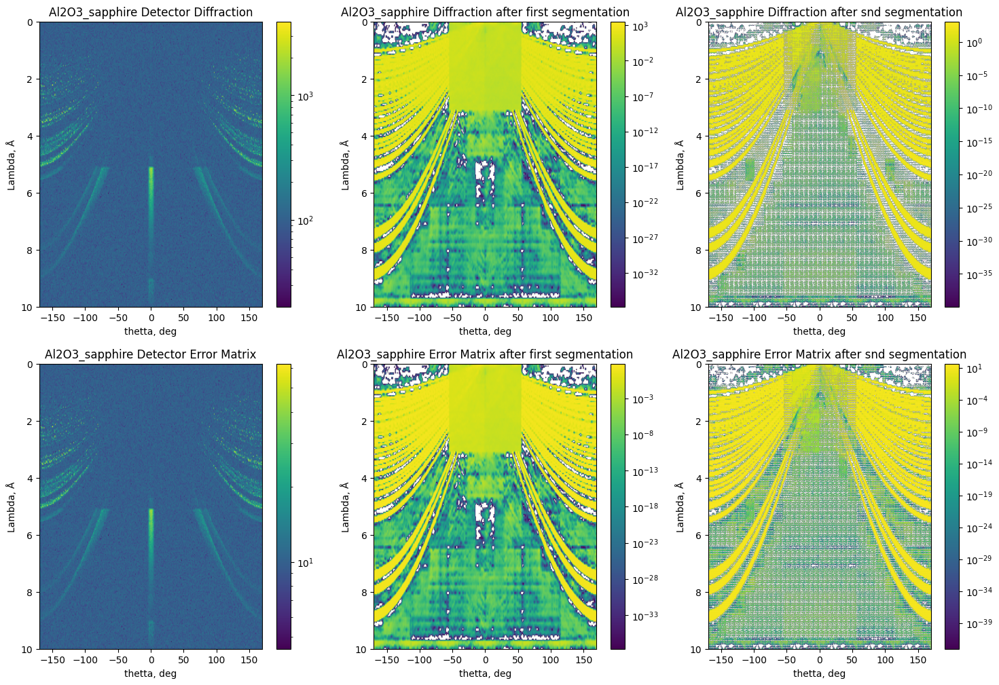

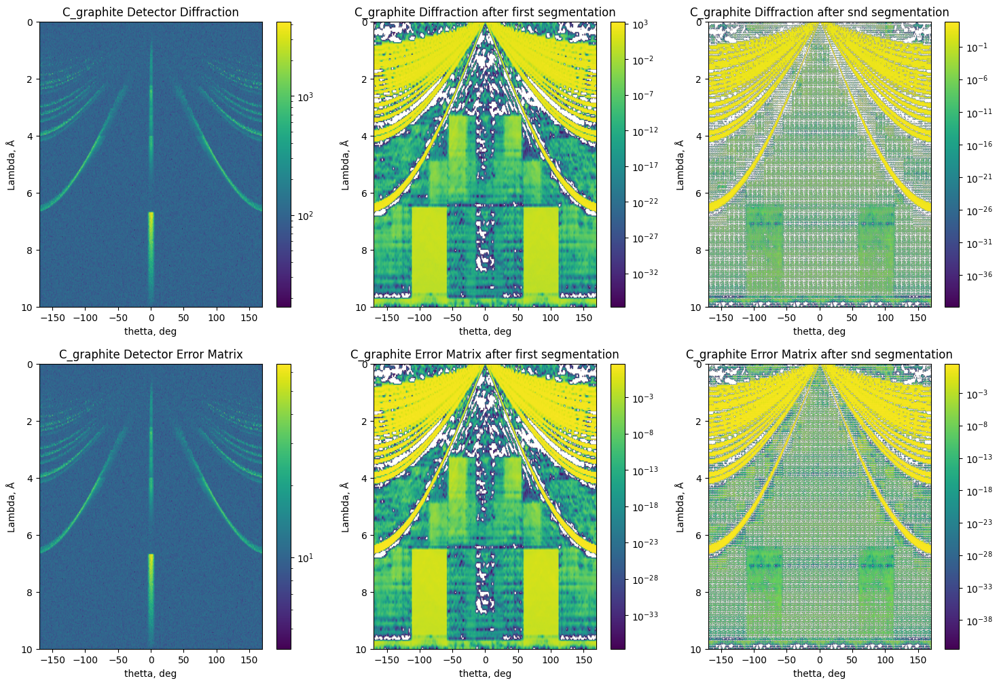

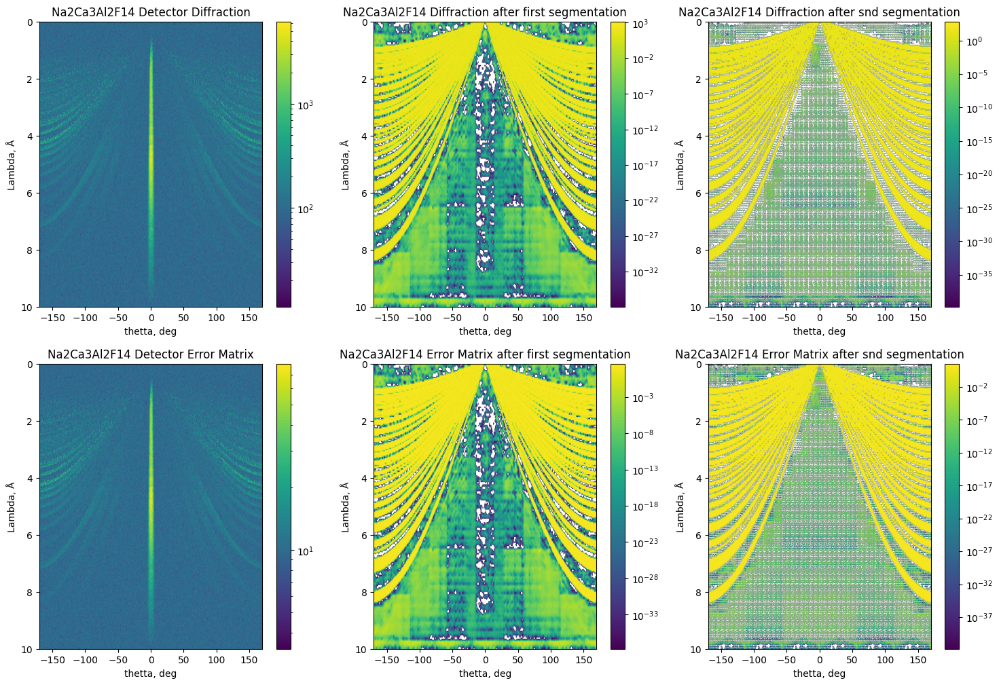

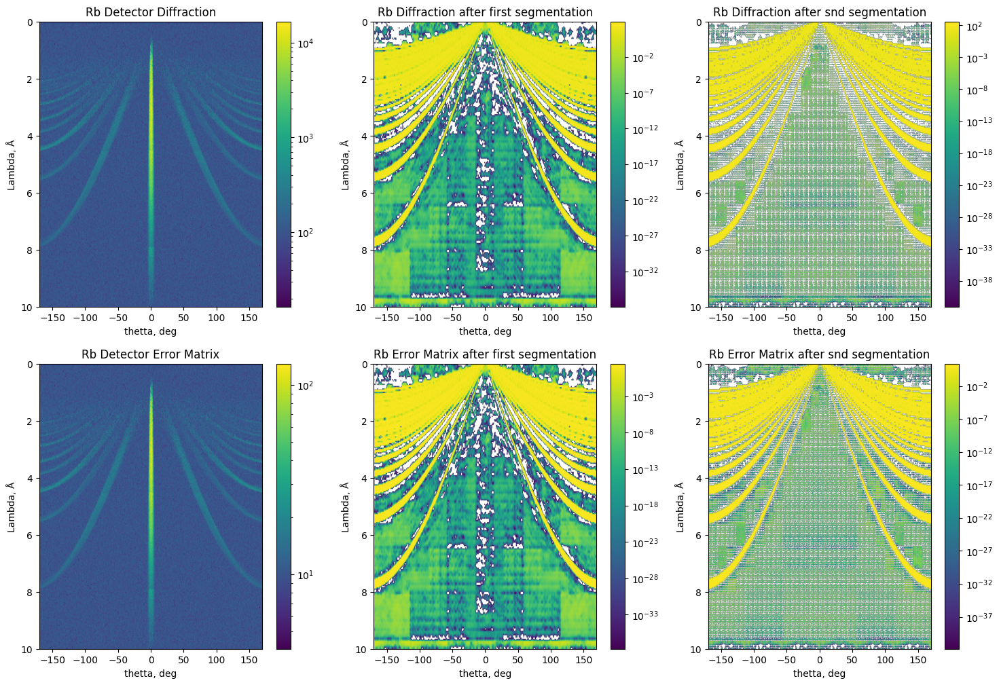

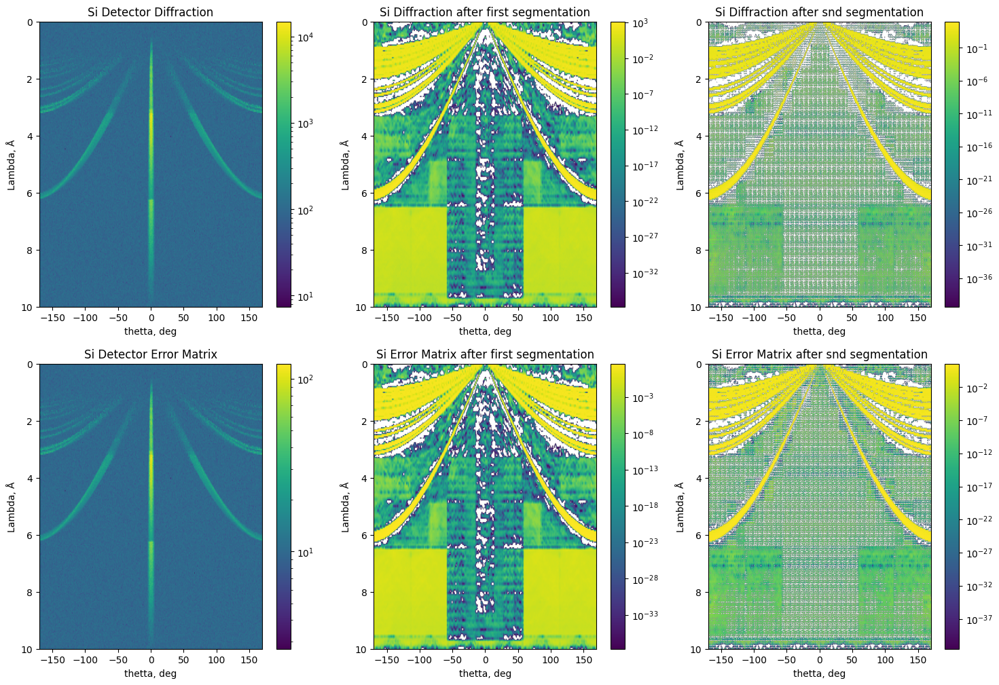

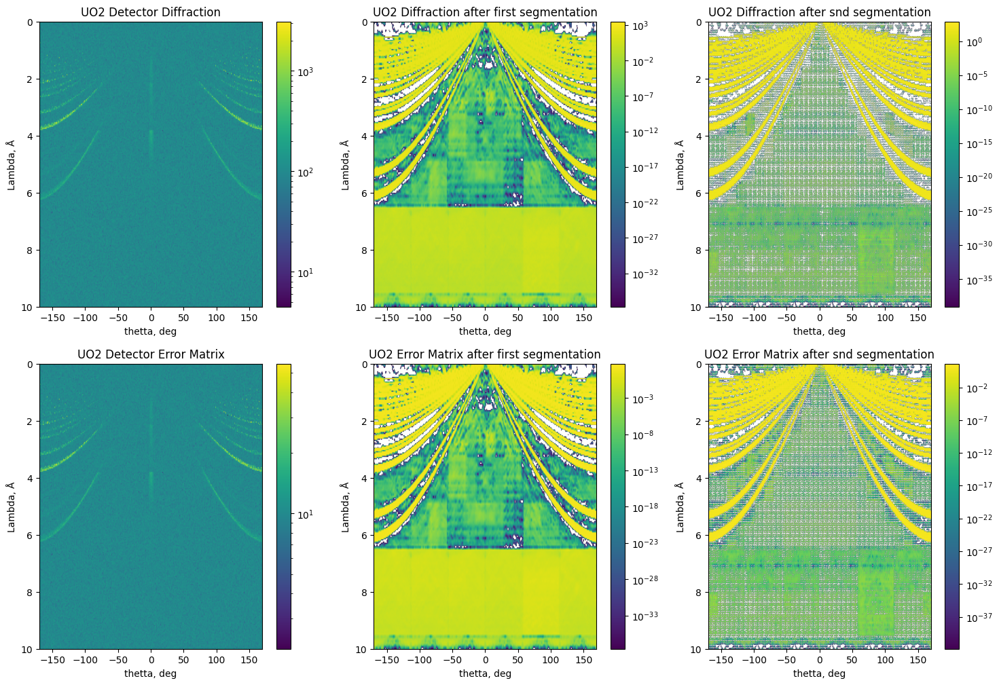

In [18]:
from ST_Inference_Pipline import SwinWNetInference

infer = SwinWNetInference(model, device)

test_samples = ['Al2O3_sapphire', 'C_graphite', 'Na2Ca3Al2F14', 'Rb', 'Si', 'UO2']

for data, crystal in zip(test, test_samples):
    data = data.unsqueeze(0)

    result = infer(data)

    filtered_data_1 = infer.images_masked_lr

    # Создаем фигуру и оси
    fig, axes = plt.subplots(2, 3, figsize=(18, 12))

    ax1, ax2, ax3 = axes[0]
    ax4, ax5, ax6 = axes[1]

    # Первый график
    im1 = ax1.imshow(data[0][0].cpu().numpy(), cmap='viridis', aspect='auto', norm='log', extent=(-170, 170, 10, 0))
    ax1.set_xlabel('thetta, deg')
    ax1.set_ylabel('Lambda, Å')
    ax1.set_title(f'{crystal} Detector Diffraction')
    plt.colorbar(im1)

    # Первый график
    im4 = ax4.imshow(data[0][1].cpu().numpy(), cmap='viridis', aspect='auto', norm='log', extent=(-170, 170, 10, 0))
    ax4.set_xlabel('thetta, deg')
    ax4.set_ylabel('Lambda, Å')
    ax4.set_title(f'{crystal} Detector Error Matrix')
    plt.colorbar(im4)

    # Первый график
    im2 = ax2.imshow(filtered_data_1[0][0].cpu().numpy(), cmap='viridis', aspect='auto', norm='log', extent=(-170, 170, 10, 0))
    ax2.set_xlabel('thetta, deg')
    ax2.set_ylabel('Lambda, Å')
    ax2.set_title(f'{crystal} Diffraction after first segmentation')
    plt.colorbar(im2)

    # Первый график
    im5 = ax5.imshow(filtered_data_1[0][1].cpu().numpy(), cmap='viridis', aspect='auto', norm='log', extent=(-170, 170, 10, 0))
    ax5.set_xlabel('thetta, deg')
    ax5.set_ylabel('Lambda, Å')
    ax5.set_title(f'{crystal} Error Matrix after first segmentation')
    plt.colorbar(im5)

    # Первый график
    im3 = ax3.imshow(result[0][0].cpu().numpy(), cmap='viridis', aspect='auto', norm='log', extent=(-170, 170, 10, 0))
    ax3.set_xlabel('thetta, deg')
    ax3.set_ylabel('Lambda, Å')
    ax3.set_title(f'{crystal} Diffraction after snd segmentation')
    plt.colorbar(im3)

    # Первый график
    im6 = ax6.imshow(result[0][1].cpu().numpy(), cmap='viridis', aspect='auto', norm='log', extent=(-170, 170, 10, 0))
    ax6.set_xlabel('thetta, deg')
    ax6.set_ylabel('Lambda, Å')
    ax6.set_title(f'{crystal} Error Matrix after snd segmentation')
    plt.colorbar(im6)

    plt.show()


========== Segmentation Metrics Low Res ==========

PixelAccuracy
0.25 thrashold PixelAccuracy: mean: 0.9351573598881563, std: 0.04283981599592809
0.50 thrashold PixelAccuracy: mean: 0.9364589219292004, std: 0.0447036602464111
0.75 thrashold PixelAccuracy: mean: 0.930421041448911, std: 0.04651467371306832
-----------------------------------------------------------------------
IoU
0.25 thrashold IoU: mean: 0.6245151817488174, std: 0.16621632437389589
0.50 thrashold IoU: mean: 0.6101519252173603, std: 0.1818151345687239
0.75 thrashold IoU: mean: 0.5471702788878853, std: 0.18391096640186208
-----------------------------------------------------------------------
Dice
0.25 thrashold Dice: mean: 0.7524936753169944, std: 0.161750126703164
0.50 thrashold Dice: mean: 0.7377465153578668, std: 0.18028328288244713
0.75 thrashold Dice: mean: 0.6846001501971235, std: 0.19301084313077282
-----------------------------------------------------------------------
Precision
0.25 thrashold Precision: mean:


========== Upscaling Metrics Summary Diffraction + Error Matrix ==========

PSNR (dB):
  Mean: 34.9500
  Std: 2.3869
  Min: 30.1612
  Max: 49.6979
  Number of samples: 240
----------------------------------------
SSIM:
  Mean: 0.9491
  Std: 0.0226
  Min: 0.8667
  Max: 0.9982
  Number of samples: 240
----------------------------------------

========== Upscaling Metrics Only Diffraction ==========

PSNR (dB):
  Mean: 38.2554
  Std: 2.4580
  Min: 32.6714
  Max: 52.5483
  Number of samples: 240
----------------------------------------
SSIM:
  Mean: 0.9621
  Std: 0.0177
  Min: 0.8921
  Max: 0.9987
  Number of samples: 240
----------------------------------------

========== Upscaling Metrics Only Error Matrix ==========

PSNR (dB):
  Mean: 33.1563
  Std: 2.4991
  Min: 28.5807
  Max: 47.9916
  Number of samples: 240
----------------------------------------
SSIM:
  Mean: 0.9362
  Std: 0.0285
  Min: 0.8298
  Max: 0.9978
  Number of samples: 240
----------------------------------------



========== Metric of divergence in integrated intensity ==========

Integral intensity:
  Mean: 1.1156
  Std: 2.3955
  Min: 0.0000
  Max: 13.5999
  Number of samples: 240
----------------------------------------

========== Peak intensity divergence metric ==========

Peak intensity:
  Mean: 6.3921
  Std: 13.3948
  Min: 0.0000
  Max: 66.3198
  Number of samples: 240
----------------------------------------

========== Peak shape divergence metric ==========

Peak shape:
  Mean: 0.0194
  Std: 0.0124
  Min: 0.0000
  Max: 0.0596
  Number of samples: 240
----------------------------------------


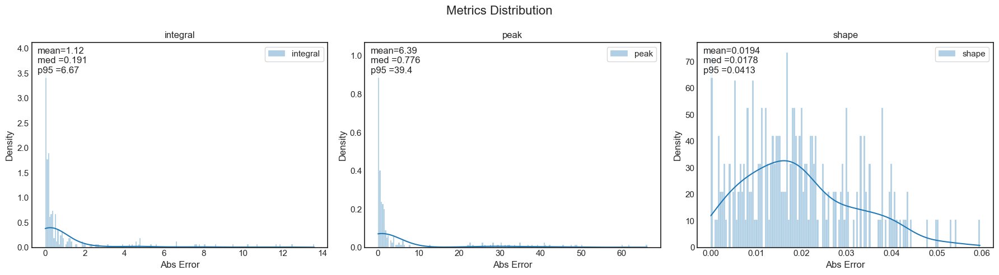

{'integral': array([2.90612299e-01, 8.64940385e-01, 6.80123991e-01, 1.24511288e+01,
        4.28165330e-02, 8.60664375e+00, 1.69530762e-01, 3.06560443e-01,
        6.61141602e+00, 5.08384768e-01, 6.14959544e-02, 2.90556178e-01,
        1.04123111e+00, 1.15925453e-01, 5.81041258e-01, 7.54828224e+00,
        5.46406269e-02, 2.21002538e-01, 5.84004770e-02, 1.51159225e-01,
        1.27584430e-01, 3.47033565e-03, 8.50020204e-01, 1.83069238e-01,
        0.00000000e+00, 3.70818164e-01, 4.94190836e-01, 1.87604699e-01,
        2.43686115e-02, 9.94871738e-02, 1.22796642e-01, 4.83416064e-02,
        4.79390506e-01, 3.62212799e-01, 3.39541431e-01, 2.86159710e-02,
        0.00000000e+00, 1.18902519e+01, 2.21399193e-01, 1.92805966e-01,
        4.00938627e-01, 6.06894598e-01, 3.03761750e-01, 1.67284368e-01,
        3.96292486e-02, 4.98909500e-01, 4.94962629e-01, 2.59204835e+00,
        1.19874048e-01, 3.91511161e-01, 1.33301587e-01, 1.18191248e+00,
        6.41669092e-01, 3.09005805e-01, 1.56248074e-

In [13]:
from tests import MetricsCalculator

MetricsCalc = MetricsCalculator(
        model=model,
        val_loader=test_loader,
        device=device)

MetricsCalc.CalculateSegmentationMetrics()
MetricsCalc.CalculateUpscalerMetrics()
MetricsCalc.CalculatePhysycalMetrics()

In [12]:
from experiments.SwinUNet import SwinWNet
from RL_policy import AlphaPolicy

model = SwinWNet(patch_size=2, in_chans=1, error_matrix=True, embed_dim=48, depths=[2, 2, 2, 2], num_heads=[3, 6, 12, 24],
                 window_size=5, mlp_ratio=4., qkv_bias=True, drop=0., attn_drop=0., drop_path=0.).to(device)

model.load_state_dict(torch.load("models/SwinWNet_diffraction+error_matrix.pth", map_location=device))

poilcy = AlphaPolicy().to(device)

In [13]:
from RL_finetuning_pipline import RLTrainer

RL_trainer = RLTrainer(
    model=model,
    policy=poilcy,
    train_loader=train_loader,
    upscaler_loss = 'SmoothL1Loss',
    device=device,
    optimizer_policy=None,
    optimizer_model=None,
    num_epochs=100,
    lambda_rec=10.0,
    lambda_intensity=2.0,
    lambda_peak=1.0,
    lambda_shape=0.5,
)

RL_trainer.fit()

100%|██████████| 320/320 [01:14<00:00,  4.32it/s]


[RL] 000 reward=-40.8468 rec=0.0038 int=6.4017 peak=28.0285 shape=0.029873 alpha=-0.239±0.900


100%|██████████| 320/320 [01:13<00:00,  4.35it/s]


[RL] 001 reward=-46.4515 rec=0.0034 int=6.4679 peak=33.5010 shape=0.029556 alpha=-0.198±0.935


100%|██████████| 320/320 [01:13<00:00,  4.37it/s]


[RL] 002 reward=-44.9800 rec=0.0034 int=6.1693 peak=32.6270 shape=0.028807 alpha=-0.199±0.845


100%|██████████| 320/320 [01:17<00:00,  4.15it/s]


[RL] 003 reward=-51.9849 rec=0.0033 int=7.5799 peak=36.8107 shape=0.028893 alpha=-0.262±0.883


100%|██████████| 320/320 [01:13<00:00,  4.35it/s]


[RL] 004 reward=-56.5192 rec=0.0033 int=7.0655 peak=42.3737 shape=0.029115 alpha=-0.212±0.834


100%|██████████| 320/320 [01:15<00:00,  4.24it/s]


[RL] 005 reward=-62.2344 rec=0.0032 int=7.2082 peak=47.8035 shape=0.029045 alpha=-0.181±0.889


100%|██████████| 320/320 [01:13<00:00,  4.34it/s]


[RL] 006 reward=-63.8815 rec=0.0032 int=6.2932 peak=51.2807 shape=0.028922 alpha=-0.213±0.880


100%|██████████| 320/320 [01:13<00:00,  4.34it/s]


[RL] 007 reward=-60.4790 rec=0.0032 int=4.8791 peak=50.7067 shape=0.028365 alpha=-0.195±0.874


100%|██████████| 320/320 [01:13<00:00,  4.35it/s]


[RL] 008 reward=-66.2440 rec=0.0032 int=6.6422 peak=52.9455 shape=0.028264 alpha=-0.275±0.892


100%|██████████| 320/320 [01:13<00:00,  4.33it/s]


[RL] 009 reward=-64.1183 rec=0.0032 int=6.1904 peak=51.7236 shape=0.028038 alpha=-0.205±0.827


 14%|█▍        | 46/320 [00:10<01:04,  4.22it/s]


KeyboardInterrupt: 